# GBSV - Mini-Challenge 2

Falls keine Code-Quelle angegeben wurde, wurde der Code zusammen mit `ChatGPT` und `Copilot` erzeugt.

Grössere Funktionen habe ich im Python File `helper.py`programmiert, damit das Notebook übersichtlich bleibt.

## Imports

In [2]:
# General libraries
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# Libraries related to image processing
from PIL import Image
import cv2
from skimage import io, color, filters, measure, morphology, util
from scipy import ndimage as ndi

# Libraries related to audio/signal processing
import IPython.display as ipd
import scipy as sp
from scipy.signal import correlate

from helper import *

# 1. Mustersuche in Bild und Signal (LE3)
## 1.1. Korrelation in Signalen

### 1.1.1 Signal mit wiederkehrende Muster

Ich werde hier 2 Signale erzeugen. Eine sehr simple Sinuswelle und viele kombinierte Sinuswelles mit einem Muster.

#### 1.1.1.1 Einfacher Signal

Dieses Signal ist eine einfache Sinuswelle mit einer Frequenz von 110 Hz, erstellt für eine Dauer von 1 Sekunde. Die Frequenz von 110 Hz entspricht dem musikalischen Ton A2. Bei einer Samplingrate von 44'100 Hz wurde diese Sinuswelle generiert, um einen klaren und kontinuierlichen Ton zu erzeugen.

Einfache Sinuswelle


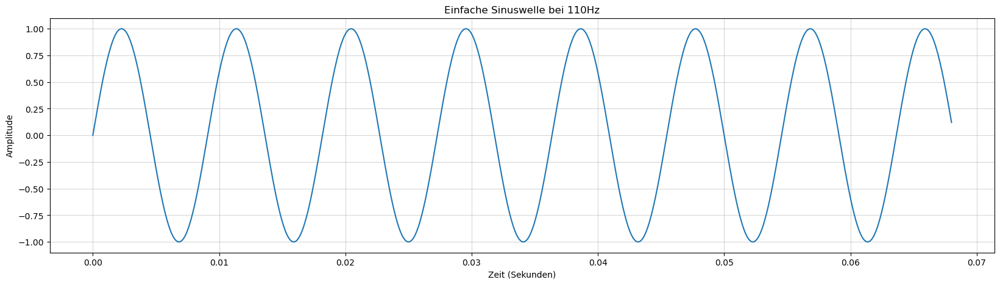

In [3]:
# Frequency of the sine wave in Hertz
frequency = 110  

# Time axis for 4 seconds
t_sine = np.linspace(0, 1, 44100)

# Generating the sine wave
sine_wave = np.sin(2 * np.pi * frequency * t_sine)

print("Einfache Sinuswelle")
ipd.display(ipd.Audio(data=sine_wave, rate=44100))

plot_signal(sine_wave[:3000], t_sine[:3000], title='Einfache Sinuswelle bei 110Hz', xlabel='Zeit (Sekunden)', ylabel='Amplitude')

In der Visualisierung werden nur die ersten 3000 Samples dargestellt, um die regelmässigen und glatten Schwingungen der Welle deutlich zu machen, die die Änderungen in der Amplitude über die Zeit zeigen.

#### 1.1.1.2 Komplexer Signal

Dieses Signal ist eine komplexere und dynamischere Kombination von Sinuswellen, die einen C-Dur-Akkord in drei verschiedenen Oktaven darstellen (C3, E3, G3; C4, E4, G4; C5, E5, G5). Das Signal wird zunächst durch Summierung dieser Sinuswellen gebildet, was zu einer reichen und harmonischen Mischung führt. Um rhythmische Variationen und ein Gefühl der Bewegung hinzuzufügen, wird das Signal dann in der Amplitude moduliert. Diese Amplitudenmodulation ist nicht konstant, sondern variiert mit der Zeit, da sie selbst von einer langsameren Sinuswelle moduliert wird. Diese Modulation erzeugt einen pulsierenden Effekt.

Komplexes Signal


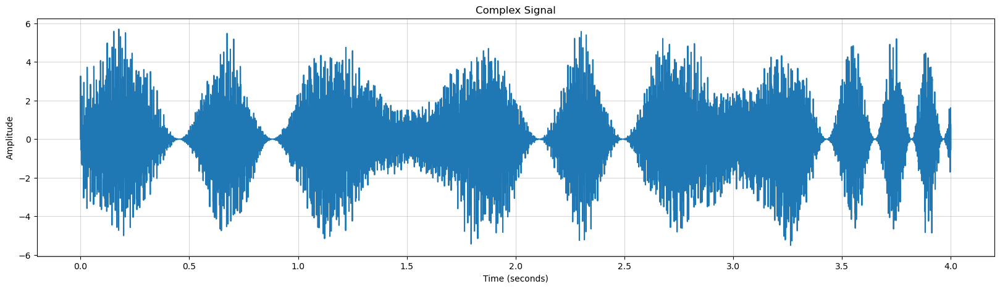

In [4]:
# Time axis for 5 seconds
t = np.linspace(0, 4, 44100 * 4)

# Frequencies for a C major chord: C, E, G in different octaves
frequencies = [261.63, 329.63, 392.00,  # C4, E4, G4
               523.25, 659.25, 783.99,  # C5, E5, G5 (One octave higher)
               130.81, 164.81, 196.00]  # C3, E3, G3 (One octave lower)

# Generating a more complex combination of sine waves
signal = np.sum([np.sin(2 * np.pi * f * t) for f in frequencies], axis=0)

# Amplitude modulation with variable rate
modulation_rate = 1 + np.sin(2 * np.pi * 0.25 * t)  # Modulation rate varies over time
signal *= 0.5 * (1 + np.sin(2 * np.pi * modulation_rate * t))

print("Komplexes Signal")
ipd.display(ipd.Audio(data=signal, rate=44100))

plot_signal(signal, t, title='Complex Signal', xlabel='Time (seconds)', ylabel='Amplitude')

### 1.1.2 Auto-Korrelation auf wiederkehrende Muster

Als nächstes werde ich die Auto-Korrelationsanalyse für beide Signale durchführen. Die Auto-Korrelation misst, wie gut das Signal zu einer verschobenen Version von sich selbst passt und dient dazu, periodische Eigenschaften (wiederkehrende Muster) innerhalb des Signals zu identifizieren.

[Guide to Autocorrelation](https://scicoding.com/practical-guide-to-autocorrelation/)

[Autocorrelation of Time Series](https://www.alpharithms.com/autocorrelation-time-series-python-432909/)

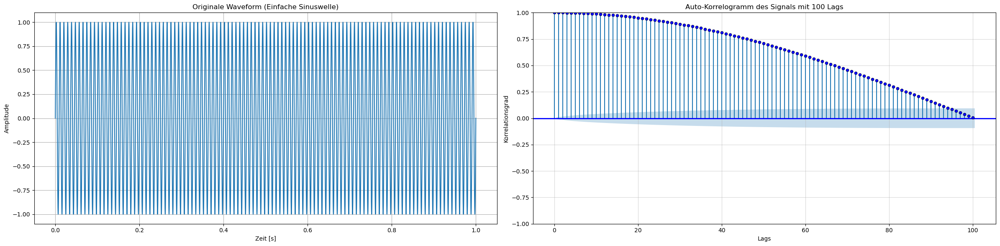

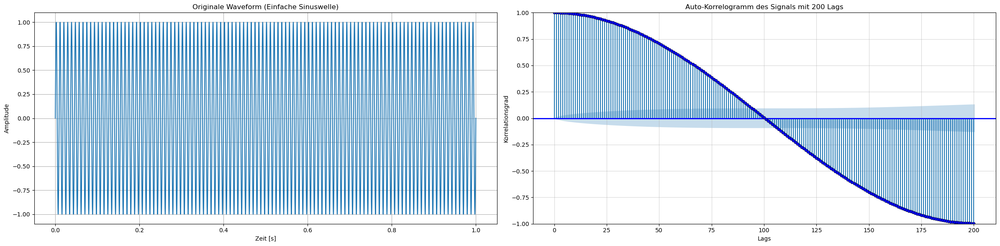

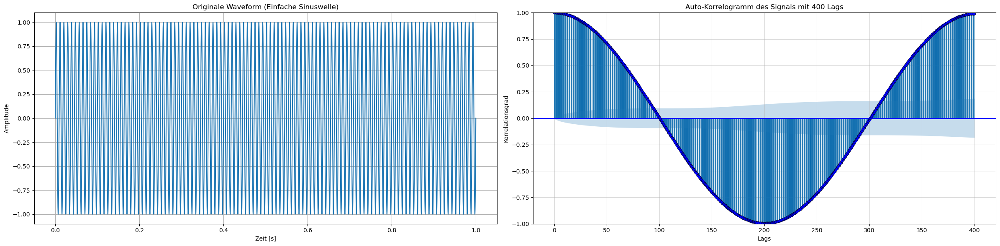

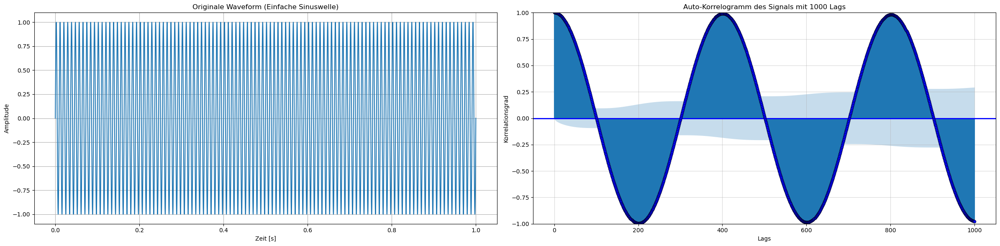

In [5]:
df_sine = pd.DataFrame(sine_wave, index=t_sine, columns=['Amplitude'])
df_sine.index.name = 'Time'

lags = [100, 200, 400, 1000]

for lag in lags:
    auto_correlation(df_sine, lag, "Einfache Sinuswelle")

Die vier Diagramme zeigen die Auto-Korrelation der einfachen Sinuswelle für vier verschiedene Lags (100, 200, 400 und 1000). 

- 100 Lags: Mit einer geringen Anzahl von Lags zeigt das Auto-Korrelogramm eine schnelle Abfolge von hohen Korrelationswerten. Dies deutet darauf hin, dass die Periode des Signals sehr kurz ist, wodurch es sich schnell wiederholt.

- 200 Lags: Die Verdoppelung der Lags führt zu einer Ausweitung des Korrelogramms, wobei die Korrelationswerte in einem breiteren Bereich verteilt sind. Die Periode des Signals bleibt erkennbar und die Korrelationswerte fallen gleichmässig ab.

- 400 Lags: Hier wird die Periodizität des Signals noch deutlicher. Die Korrelationswerte bilden eine wellenförmige Kurve, die die periodische Natur des Sinussignals über einen längeren Zeitraum widerspiegelt.

- 1000 Lags: Bei einer hohen Anzahl von Lags zeigt das Auto-Korrelogramm eine deutlich wellenförmige Struktur, die über längere Zeit konsistent bleibt. Die hohen und niedrigen Korrelationswerte wechseln sich regelmässig ab, was ein klares Zeichen für ein stark periodisches Signal ist.

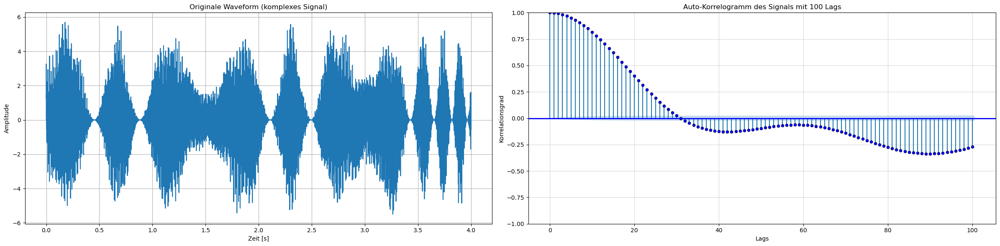

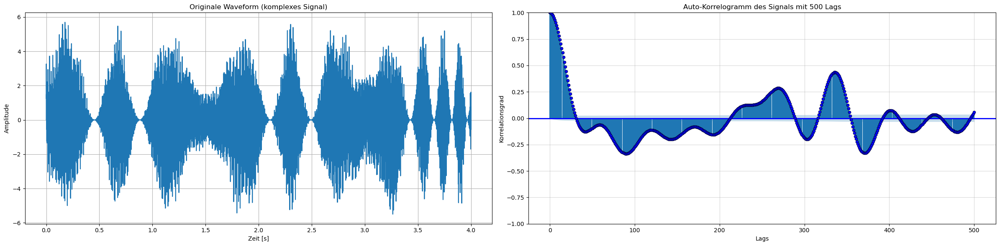

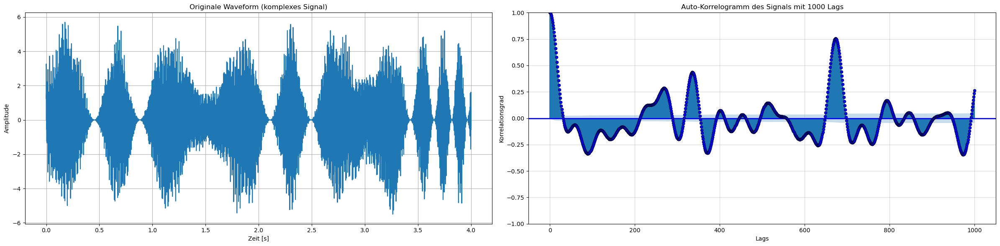

In [6]:
df_complex = pd.DataFrame(signal, index=t, columns=['Amplitude'])
df_complex.index.name = 'Time'

lags = [100, 500, 1000]

for lag in lags:
    auto_correlation(df_complex, lag, "komplexes Signal")

- 100 Lags: Der Auto-Korrelogramm zeigt eine rasche Abnahme der Korrelation, gefolgt von kleineren Fluktuationen, die sich mit der Zeit stabilisieren. Dies deutet darauf hin, dass das Signal eine Art von regelmässigem Muster oder Rhythmus aufweist, aber die Komplexität des Signals verursacht Variationen in der Korrelation über kürzere Lags.

- 500 Lags: Mit einer erhöhten Anzahl von Lags zeigt das Korrelogramm eine deutliche periodische Fluktuation, die die komplexe Natur des Signals widerspiegelt. Es gibt ausgeprägte Spitzen und Täler, die darauf hindeuten, dass das Signal aus mehreren überlagerten Frequenzen besteht, die ihre eigene Periodizität haben.

- 1000 Lags: Bei der höchsten Anzahl von Lags wird die komplexe Struktur des Signals noch offensichtlicher. Die Korrelationswerte zeigen eine ausgeprägte wellenförmige Bewegung, was auf eine Überlagerung verschiedener periodischer Muster im Signal hinweist. Die Peaks im Auto-Korrelogramm sind weniger regelmässig als bei einer einfachen Sinuswelle, was auf die grössere Komplexität des Signals hindeutet.

### 1.3 Kann die Periodizität deines Musters via Auto-Korrelogramm sichtbar gemacht werden?
Ja, die Periodizität des Musters kann durch das Auto-Korrelogramm sichtbar gemacht werden. Die Experimente mit verschiedenen Lags haben gezeigt, dass die Auto-Korrelation eine wiederkehrende Struktur innerhalb des komplexen Signals offenlegen kann. Bei den geringeren Lags (100 und 500) sind die wiederkehrenden Muster durch regelmässige Fluktuationen im Korrelogramm erkennbar, obwohl die komplexe Natur des Signals zu Variationen führt. Bei 1000 Lags sind diese Muster weniger regelmässig, was auf die Überlagerung verschiedener Frequenzkomponenten hinweist. Obwohl die Periodizität in einem komplexen Signal nicht so ausgeprägt ist wie in einer einfachen Sinuswelle, zeigt das Auto-Korrelogramm dennoch klar wiederkehrende Muster und bestätigt die periodische Natur des Signals.

### 1.4 Diskutiere deine Methoden- und Parameterwahl sowie die Resultate in ca. 150 Wörtern. 

Die Auswahl der Methoden für die Analyse der Periodizität komplexer Signale mittels Auto-Korrelation erwies sich als effektiv. Die Parameter wurden so gewählt, dass sie eine Kombination aus verschiedenen Frequenzen und Amplitudenmodulation darstellen, was ein realistisches Szenario für ein komplexes Signal simuliert. Die Verwendung unterschiedlicher Lags ermöglichte es, die Struktur des Signals auf verschiedenen Skalen zu untersuchen. Die Resultate zeigen, dass trotz der komplexen Zusammensetzung des Signals die Auto-Korrelogramme wiederkehrende Muster enthüllen konnten. Bei geringeren Lags war die Periodizität des Signals durch schnelle Abnahmen und Schwankungen der Korrelation deutlich, während bei höheren Lags die Überlagerung verschiedener periodischer Komponenten sichtbar wurde. Diese Erkenntnisse bestätigen, dass die Auto-Korrelation ein robustes Werkzeug zur Identifizierung periodischer Eigenschaften in komplexen Signalen ist.

Nun schneiden wir ein Stück des komplexen Signals aus und versuchen, es im Ursprungssignal mithilfe der Kreuzkorrelation zu finden.

### 1.1.5 Schneide nun ein Stück deines Signals aus und versuche es via Kreuzkorrelation im Ursprungssignal zu finden. 

Der Prozess beginnt mit dem Ausschneiden eines Segments von einer Sekunde Länge aus dem Anfang des Originalsignals und der Visualisierung des Segments. Dieses Segment wird dann verwendet, um eine Kreuzkorrelation mit dem gesamten Originalsignal durchzuführen.

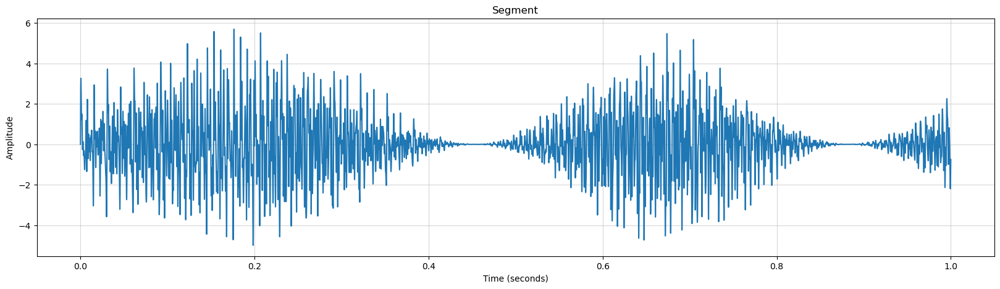

1 Sekunde des Signals


In [7]:
# Cut 1 second from the signal
segment_length = 44100
segment = signal[:segment_length]

plot_signal(segment, t[:segment_length], title='Segment', xlabel='Time (seconds)', ylabel='Amplitude')

print("1 Sekunde des Signals")
ipd.display(ipd.Audio(data=segment, rate=44100))

**Kreuzkorrelation**

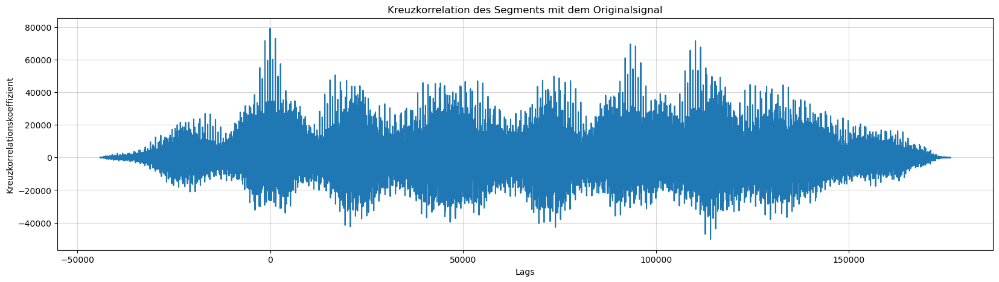

Offset: 0 samples


In [8]:
# Perform cross-correlation
cross_correlation = correlate(signal, segment, mode='full')
lags = np.arange(-len(segment) + 1, len(signal))

plot_cross_correlation(cross_correlation, lags, title='Kreuzkorrelation des Segments mit dem Originalsignal')

# Find the offset of the best match
offset = lags[np.argmax(cross_correlation)]
print('Offset: {} samples'.format(offset))

Die Grafik zeigt die Kreuzkorrelation eines ausgeschnittenen Segments mit dem Originalsignal.

Das Ergebnis eines Offsets von 0 Samples bedeutet, dass das ausgeschnittene Segment die höchste Übereinstimmung mit dem Anfang des Originalsignals aufweist, ohne dass eine Verschiebung erforderlich ist. Dies ist zu erwarten, da das Segment direkt vom Anfang des Originalsignals genommen wurde.

Das Diagramm zeigt auch, dass es neben dem Hauptpeak bei 0 Lags andere Spitzen gibt, die auf andere Stellen im Signal hinweisen, an denen das Segment ebenfalls ähnliche Muster aufweist, aber mit weniger Übereinstimmung als beim Anfang des Signals, zum Beispiel bei rund 90'000 und 115'000 Lags. Diese sekundären Peaks sind typisch für Signale mit wiederkehrenden Mustern oder sich wiederholenden Elementen.

### 1.1.6 Warum passt diese Stelle?

Die Übereinstimmung der Stelle wird, wie vorhin erklärt, durch den höchsten Peak im Kreuzkorrelationsdiagramm angezeigt. Da dieser Peak bei einem Lag von 0 Samples auftritt, bedeutet dies, dass das ausgeschnittene Segment ohne Verschiebung perfekt zum Anfang des Originalsignals passt.

### 1.1.7 Segment verändern & Kreuzkorrelation erneut durchführen

Um die Robustheit der Kreuzkorrelation zu testen, werde ich das ursprünglich ausgeschnittene Segment in drei separaten Experimenten modifizieren:

- **Experiment 1: Rauschen hinzufügen**: Im ersten Experiment füge ich dem Segment eine geringe Menge Rauschen hinzu. Dies simuliert die häufig vorkommende Situation in realen Signalverarbeitungsszenarien, wo Signale durch äussere Einflüsse gestört werden können.

- **Experiment 2: Amplitude modifizieren**: Im zweiten Experiment ändere ich die Amplitude des Segments, um zu prüfen, ob Änderungen in der Signalstärke die Auffindbarkeit des Segments im Originalsignal beeinflussen.

- **Experiment 3: Filterung**: Im dritten Experiment wende ich einen Tiefpassfilter auf das Segment an, um zu sehen, ob die Kreuzkorrelation das Segment im Originalsignal finden kann, wenn es durch einen Filter verändert wurde.

Für alle Experimente wird dann eine Kreuzkorrelationsanalyse durchgeführt, um zu bestimmen, ob und wie genau das modifizierte Segment im Originalsignal identifiziert werden kann. Die Ergebnisse werden grafisch dargestellt, um die Positionen der grössten Übereinstimmung zu visualisieren.

#### 1.1.7.1 Rauschen hinzufügen

Modifiziertes Signal mit Rauschen


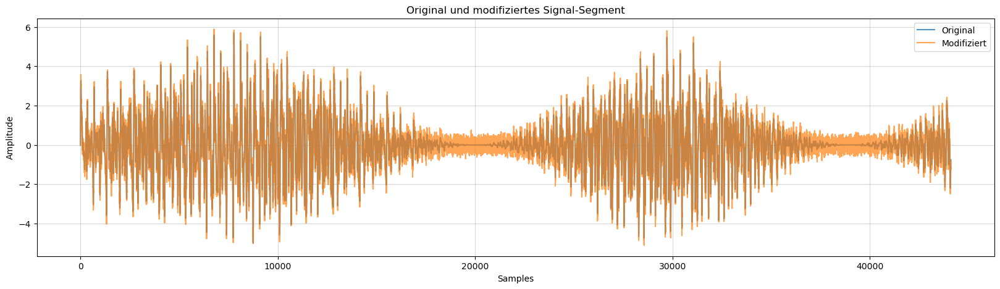

In [9]:
# Modify the segment by adding a small amount of noise
noise = np.random.normal(0, 0.2, segment_length)  # Noise with standard deviation of 0.2
modified_segment = segment + noise

print('Modifiziertes Signal mit Rauschen')
ipd.display(ipd.Audio(data=modified_segment, rate=44100))

plot_original_modified_signal(segment, modified_segment, title='Original und modifiziertes Signal-Segment')

In diesem Diagramm überlappen das Original- und das modifizierte Signal. Trotz der Hinzufügung von Rauschen, das als eine Erhöhung der Amplitudenschwankungen und verminderte Glättungen sichtbar ist, bleibt die zugrundeliegende Form des Signals erkennbar. Dies deutet darauf hin, dass das modifizierte Segment immer noch Ähnlichkeiten mit dem Original aufweist.

**Kreuzkorrelation**

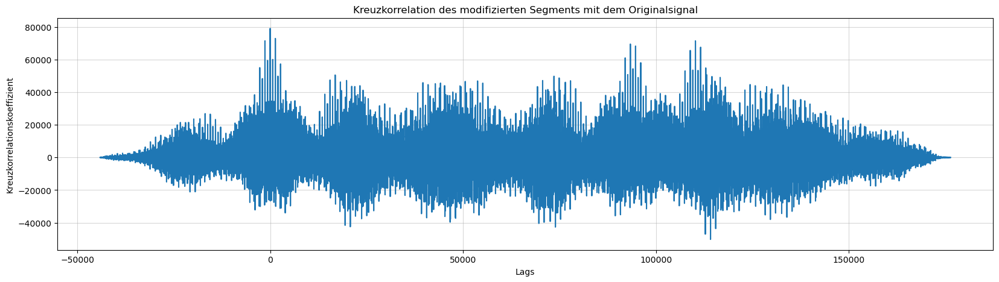

Offset: 0 samples


In [10]:
# Perform cross-correlation with the noise segment
cross_corr_noise = correlate(signal, modified_segment, mode='full')
lags_modified = np.arange(-len(modified_segment) + 1, len(signal))

plot_cross_correlation(cross_corr_noise, lags_modified, title='Kreuzkorrelation des modifizierten Segments mit dem Originalsignal')

# Find the offset of the best match for the modified segment
offset_modified = lags_modified[np.argmax(cross_corr_noise)]
print('Offset: {} samples'.format(offset_modified))

In diesem Diagramm zeigt die Kreuzkorrelation des modifizierten Segments mit dem Originalsignal. Trotz der Rauschzufügung sind deutliche Spitzen zu erkennen, die darauf hinweisen, dass das Segment im Originalsignal identifiziert werden kann.

Der Vorgang zeigt, dass die Kreuzkorrelation robust genug ist, um ein Segment auch nach einer Modifikation durch Rauschen im Originalsignal zu finden.

#### 1.1.7.2 Amplitude modifizieren

Modifiziertes Signal mit erhöhter Amplitude


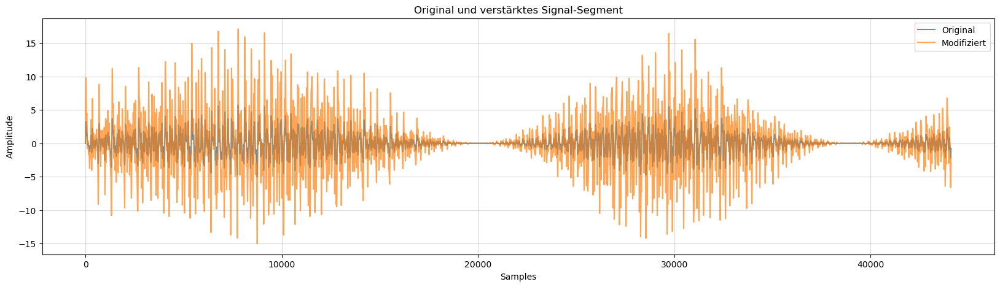

In [11]:
amplified_segment = segment * 3

print('Modifiziertes Signal mit erhöhter Amplitude')
ipd.display(ipd.Audio(data=amplified_segment, rate=44100))

plot_original_modified_signal(segment, amplified_segment, title='Original und verstärktes Signal-Segment')

**Kreuzkorrelation**

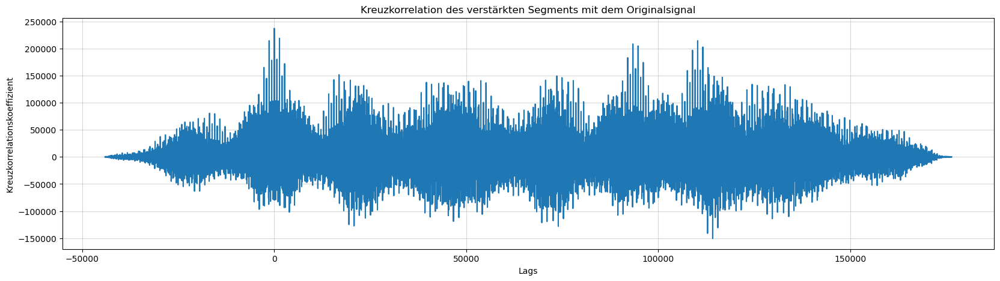

Offset: 0 samples


In [12]:
cross_corr_amplified = correlate(signal, amplified_segment, mode='full')
lags_amplified = np.arange(-len(amplified_segment) + 1, len(signal))

plot_cross_correlation(cross_corr_amplified, lags_amplified, title='Kreuzkorrelation des verstärkten Segments mit dem Originalsignal')

offset_amplified = lags_amplified[np.argmax(cross_corr_amplified)]
print('Offset: {} samples'.format(offset_amplified))

Der resultierende Plot der Kreuzkorrelation zeigt auf, dass das modifizierte Segment immer noch gleich im Originalsignal identifiziert werden kann. Der Lag, an dem der höchste Peak im Kreuzkorrelationsdiagramm auftritt, hat sich nicht verändert. ​​

#### 1.1.7.3 Filterung

Tiefpassgefiltertes Signal


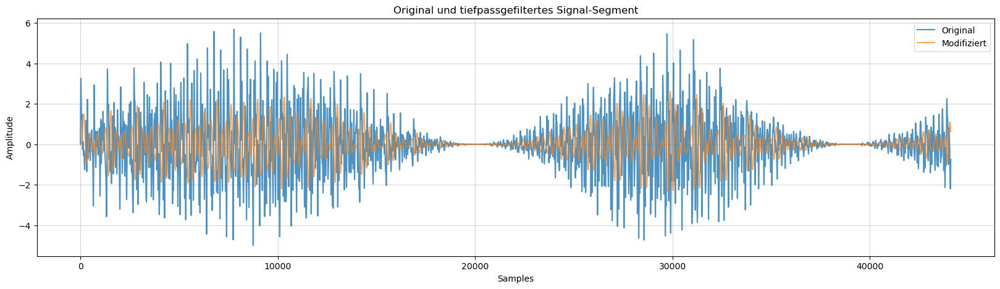

In [13]:
cutoff_frequency = 200
b, a = butter_lowpass(cutoff_frequency, 44100)
filtered_segment = lfilter(b, a, segment)

print('Tiefpassgefiltertes Signal')
ipd.display(ipd.Audio(data=filtered_segment, rate=44100))

plot_original_modified_signal(segment, filtered_segment, title='Original und tiefpassgefiltertes Signal-Segment')

**Kreuzkorrelation**

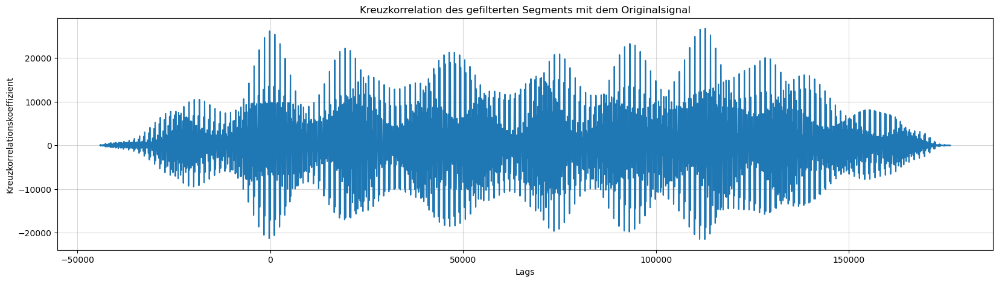

Offset: 112803 samples


In [14]:
cross_corr_filtered = correlate(signal, filtered_segment, mode='full')
lags_filtered = np.arange(-len(filtered_segment) + 1, len(signal))

plot_cross_correlation(cross_corr_filtered, lags_filtered, title='Kreuzkorrelation des gefilterten Segments mit dem Originalsignal')

offset = lags[np.argmax(cross_corr_filtered)]
print('Offset: {} samples'.format(offset))

Die Kreuzkorrelation nach der Anwendung des Tiefpassfilters zeigt eine veränderte Dynamik in der Ähnlichkeitsbeziehung zwischen dem gefilterten Segment und dem Originalsignal. Der auffälligste Peak bei einem Lag von 112'803 Samples zeigt die Stelle der stärksten Übereinstimmung ausserhalb des Anfangs des Originalsignals. Dieser Lag deutet darauf hin, dass das gefilterte Segment möglicherweise eine ähnliche Struktur an einer anderen Stelle im Signal findet oder dass die Filterung Aspekte des Segments hervorgehoben hat, die vorher weniger offensichtlich waren.

Die Tatsache, dass der Kreuzkorrelationskoeffizient nach der Filterung deutlich niedriger ist (ca. 26'000 im Vergleich zu vorher ca. 80'000 und 240'000), deutet darauf hin, dass die Filterung das Signal in einer Weise verändert hat, welche die Korrelation beeinträchtigt. Dies könnte bedeuten, dass wichtige Merkmale, die zur Erkennung des Originalsegments beitragen, in den höheren Frequenzen liegen, die durch den Tiefpassfilter entfernt wurden.

### 1.1.8 Welche Arten von Veränderungen werden toleriert? Welche nicht? 

Die Kreuzkorrelation ist in gewissem Masse robust gegenüber kleinen Veränderungen wie das Hinzufügen von Rauschen oder leichte Amplitudenänderungen. Diese Arten von Veränderungen verzerren das Signal, ohne seine grundlegende Struktur vollständig zu verändern, und werden noch erkannt, wie meine Experimente gezeigt haben.

Allerdings wird die Kreuzkorrelation empfindlicher auf Veränderungen reagieren, die die grundlegenden Frequenzkomponenten des Signals beeinflussen. Ein Tiefpassfilter, der signifikante Frequenzanteile des Signals entfernt, verändert das Signal so sehr, dass es möglicherweise nicht mehr genau an seiner ursprünglichen Position im Originalsignal identifiziert werden kann, was durch die Reduktion des Kreuzkorrelationskoeffizienten und das Auftreten eines Maximums bei einem anderen Lag als 0 im Experiment deutlich wurde. Solche Veränderungen, die die charakteristischen Merkmale des Signals beeinträchtigen, werden nicht gut toleriert und können die Fähigkeit der Kreuzkorrelation, das Segment korrekt zu lokalisieren, stark beeinträchtigen.

### 1.1.9 Diskutiere die Resultate in ca. 150 Wörtern. 

In den durchgeführten Experimenten zur Kreuzkorrelation wurden drei verschiedene Veränderungen an einem Signalsegment vorgenommen: das Hinzufügen von Rauschen, die Änderung der Amplitude und die Anwendung eines Tiefpassfilters. Die ersten beiden Veränderungen hatten geringe Auswirkungen auf die Identifizierbarkeit des Segments im Originalsignal, wobei die Kreuzkorrelationskoeffizienten hoch blieben und die Peaks nahe bei Lag 0 lagen. Dies zeigt, dass die Kreuzkorrelation gegenüber solchen kleinen Störungen robust ist. Das dritte Experiment mit dem Tiefpassfilter jedoch führte zu einer erheblichen Reduktion des Kreuzkorrelationskoeffizienten und verschob den Hauptpeak von Lag 0 zu einem anderen Wert. Dies verdeutlicht, dass signifikante Änderungen im Frequenzspektrum des Signals – insbesondere solche, die wesentliche Komponenten entfernen – die Auffindbarkeit des Segments im Originalsignal beeinträchtigen. Insgesamt illustrieren die Resultate die Stärken und Grenzen der Kreuzkorrelation als Methode zur Signalanalyse und -erkennung.

## 1.2. Segmentierung, morphologische Operationen, Objekteigenschaften in Bildern

Suche 1 Bild, welches mehrere ähnliche Objekte enthält. Diese Objekte sollen mittels geeigneter Methoden segmentiert werden. Die Resultate sollen als gelabelte Bilder (binär oder pro Klasse 1 Label) gespeichert werden. Zeige dabei, wie du die Labelmasken mittels morphologischer Operationen verbessert hast. Erkläre hier für jede angewendete Operation in 1-2 Sätzen, warum du diese Operation anwendest. Zeige auch in Einzelbildern die Zwischenresultate deiner angewendeten Operationen und dass du nur minimal die Objekte verändert hast (z.B. keine Verschiebungen, Verkleinerungen oder Vergrösserungen). Extrahiere am Ende deine einzelnen Objekte, zähle und vermesse 2-3 Eigenschaften deiner extrahierten Objekte mittels geeigneten Methoden. Erkläre pro Eigenschaft in 1-2 Sätzen, warum du diese gewählt hast und ob die Resultate brauchbar sind.  

Erstelle dann ein möglichst minimales aber repräsentatives Skeleton eines deiner Objekte und gebe die Anzahl Pixel des Skeletons aus. 

Diskutiere deine Erkenntnisse und Resultate in ca. 150 Wörtern. 

**Weiterführende Links:**
- skimage: Label image regions
- skimage: Segment human cells (in mitosis)
- skimage: Measure region properties

### 1.2.1 Bild auswählen

Bild von [mactechnews](https://www.mactechnews.de/gallery/picture/Verkehrsschilder-leicht-verstaendlich-123187.html)

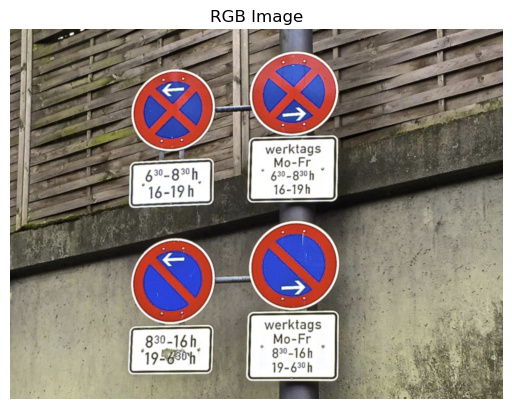

In [15]:
image = cv2.imread("Bilder/verkehrschild.png")
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image_grey = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
image_hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

plot_image(image_rgb, title='RGB Image', cmap=None)

### 1.2.2 Maskierung

Bevor ich mit der Segmentierung beginne, erstelle ich eine Maskierung, um die roten Bereiche im Bild zu isolieren. Am Ende werden diese Bereiche auch Teil der jeweiligen Schilder sein. Somit sollten die Schilder besser erkennbar und segmentierbar sein.

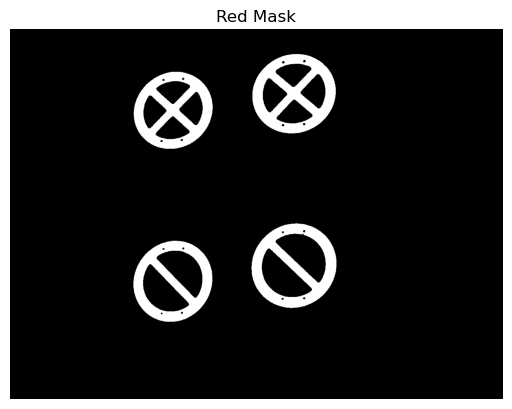

In [18]:
# Adjust the HSV color space thresholds for red color
# Red has hue values around 0 and around 180 in the HSV color space.
# We will create two masks for these ranges and then combine them.
lower_red1 = np.array([0, 100, 100])
upper_red1 = np.array([10, 255, 255])
lower_red2 = np.array([160, 100, 100])
upper_red2 = np.array([179, 255, 255])

# Create the masks
mask1 = (image_hsv[:,:,0] >= lower_red1[0]) & (image_hsv[:,:,0] <= upper_red1[0]) & \
        (image_hsv[:,:,1] >= lower_red1[1]) & (image_hsv[:,:,1] <= upper_red1[1]) & \
        (image_hsv[:,:,2] >= lower_red1[2]) & (image_hsv[:,:,2] <= upper_red1[2])
mask2 = (image_hsv[:,:,0] >= lower_red2[0]) & (image_hsv[:,:,0] <= upper_red2[0]) & \
        (image_hsv[:,:,1] >= lower_red2[1]) & (image_hsv[:,:,1] <= upper_red2[1]) & \
        (image_hsv[:,:,2] >= lower_red2[2]) & (image_hsv[:,:,2] <= upper_red2[2])

# Combine masks
red_mask = mask1 | mask2

plot_image(red_mask, title='Red Mask', cmap='gray')

Hier sehen wir die isolierte rote Bereiche. Ich werde diese nun mit dem originalen graustufenbild kombinieren:

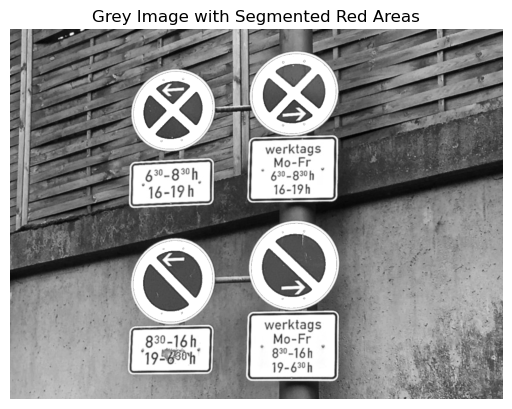

In [20]:
# Combine with the grayscale image to segment the red areas
segmented_red = np.where(red_mask, 255, image_grey)

plot_image(segmented_red, title='Grey Image with Segmented Red Areas', cmap='gray')

Die Verfeinerung der Segmentierung für die roten Bereiche hat zu einer klareren Darstellung der Verkehrsschilder geführt. Ich werde nun mit diesem Bild weiterfahren.

In [21]:
image_grey = segmented_red

### 1.2.2 Thresholding

[scikit-image](https://scikit-image.org/docs/stable/api/skimage.filters.html) hat einige Filter-Methoden, das Bild zu binarisieren. Ich habe hier drei davon auf mein Bild angewendet; Mean, Otsu und Triangle.

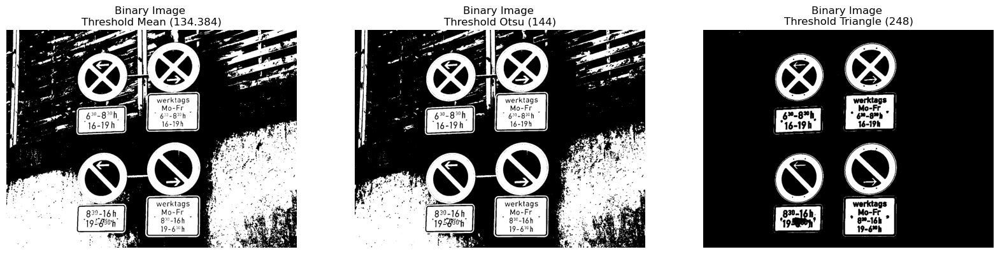

In [22]:
thresh_mean = round(filters.threshold_mean(image_grey),3)
thresh_otsu = round(filters.threshold_otsu(image_grey),3)
thresh_triangle = round(filters.threshold_triangle(image_grey),3)

plot_image_list(
    img_list=[image_grey > thresh_mean, image_grey > thresh_otsu, image_grey > thresh_triangle],
    titles=[
        'Binary Image \nThreshold Mean ({})'.format(thresh_mean),
        'Binary Image \nThreshold Otsu ({})'.format(thresh_otsu),
        'Binary Image \nThreshold Triangle ({})'.format(thresh_triangle)],
    cmap='gray'
)

Im Vergleich scheint die Triangle-Threshold in diesem Fall die beste der drei Segmentierung zu liefern, da sie alles im Hintergrund entfernt hat und gleichzeitig nicht zu viele Details der Schilder vermindert hat. Es könnte jedoch sein, dass die Triangle-Methode etwas zu streng ist, wodurch die Gefahr besteht, dass zu viele Details verloren gehen.

Schauen wir die Labels an:

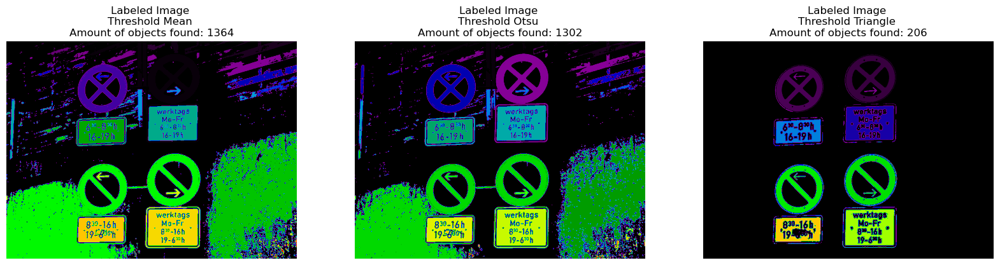

In [23]:
label_image_mean = measure.label(image_grey > thresh_mean)
label_image_otsu = measure.label(image_grey > thresh_otsu)
label_image_triangle = measure.label(image_grey > thresh_triangle)

plot_image_list(
    img_list=[label_image_mean, label_image_otsu, label_image_triangle],
    titles=[
        'Labeled Image \nThreshold Mean \nAmount of objects found: {}'.format(len(measure.regionprops(label_image_mean))),
        'Labeled Image \nThreshold Otsu \nAmount of objects found: {}'.format(len(measure.regionprops(label_image_otsu))),
        'Labeled Image \nThreshold Triangle \nAmount of objects found: {}'.format(len(measure.regionprops(label_image_triangle)))],
    cmap=plt.cm.nipy_spectral
)

Die Segmentierungsergebnisse der Mean-, der Otsu- und der Triangle-Methode deuten auf eine Übersegmentierung hin, was sich in der übermässig hohen Anzahl von Labels in jedem Fall zeigt. Die Methode des Mean-Thresholds ergab 1364 Objekte, die Otsu-Methode identifizierte 1302 Objekte und die Triangle-Methode fand 206 Objekte. Diese Zahlen deuten darauf hin, dass jede Methode nicht nur die Verkehrsschilder erfasst, die die Objekte von Interesse sind, sondern auch viele irrelevante Merkmale oder Rauschen, was zu einer Vielzahl von unnötigen und fremden Markierungen führt.

Bevor ich mit dem Fine-Tuning der Segmentierung fortfahre, möchte ich einige manuelle Thresholds ausprobieren. Ich finde, dass ein Threshold zwischen 170 und 220 die beste Segmentierung liefern könnte.

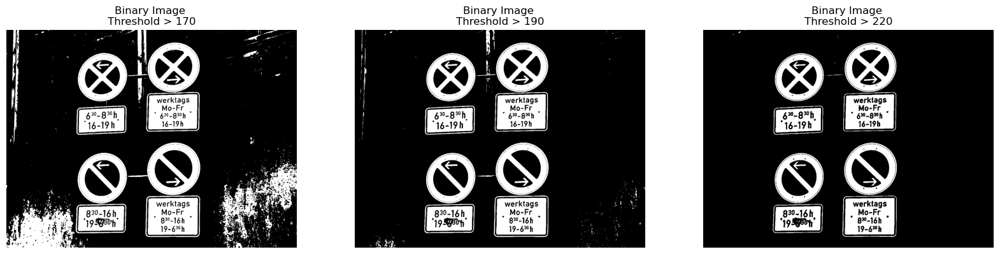

In [24]:
plot_image_list(
    img_list=[image_grey > 170, image_grey > 190, image_grey > 220],
    titles=['Binary Image \nThreshold > 170', 'Binary Image \nThreshold > 190', 'Binary Image \nThreshold > 220'],
    cmap='gray'
)

- Threshold > 170: Beim Schwellenwert von 170 wurde ein Teil des Hintergrundrauschens entfernt, aber es ist immer noch eine grosse Menge vorhanden. Einige Details der Schilder werden besser hervorgehoben, aber das Bild ist nicht sauber genug für eine präzise Segmentierung.

- Threshold > 190: Bei diesem Schwellenwert wird das Hintergrundrauschen weiter reduziert, aber es ist immer noch vorhanden.

- Threshold > 220: Dieser höhere Schwellenwert liefert die sauberste der drei binären Masken. Die Zeichen sind gut definiert und der Grossteil des Hintergrundrauschens ist eliminiert. Die Grenzen der Zeichen sind klar, was für eine genaue Segmentierung und anschliessende Analyse entscheidend ist.

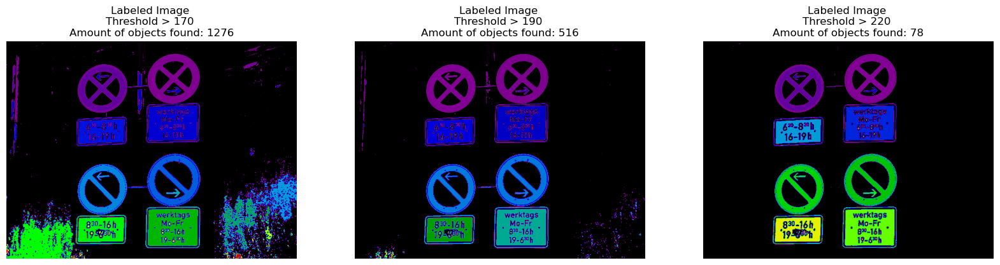

In [25]:
label_image_170 = measure.label(image_grey > 170)
label_image_190 = measure.label(image_grey > 190)
label_image_220 = measure.label(image_grey > 220)

plot_image_list(
    img_list=[label_image_170, label_image_190, label_image_220],
    titles=[
        'Labeled Image \nThreshold > 170 \nAmount of objects found: {}'.format(len(measure.regionprops(label_image_170))),
        'Labeled Image \nThreshold > 190 \nAmount of objects found: {}'.format(len(measure.regionprops(label_image_190))),
        'Labeled Image \nThreshold > 220 \nAmount of objects found: {}'.format(len(measure.regionprops(label_image_220)))],
    cmap=plt.cm.nipy_spectral
)

Die Segmentierungsergebnisse mit Thresholds von 170 und 190 deuten auf eine Übersegmentierung hin, was sich in der übermässig hohen Anzahl von Labels in jedem Fall zeigt. Die Methode mit Threshold 220 fand 73 Objekte, was eine erhebliche Verbesserung darstellt, aber immer noch sehr viele Labels sind. 

Um dieser Übersegmentierung entgegenzuwirken, wird der nächste Schritt darin bestehen, die Segmentierung durch morphologische Operationen zu verfeinern. Diese Operationen, zu denen Prozesse wie Erosion, Dilatation, Öffnen und Schliessen gehören, können helfen, Rauschen und kleine irrelevante Objekte zu entfernen und Löcher innerhalb der Objekte zu füllen. Dies führt zu einer saubereren und genaueren Segmentierung. Durch die Feinabstimmung dieser morphologischen Operationen möchte ich die Qualität der Segmentierung so verbessern, dass das resultierende beschriftete Bild die tatsächliche Anzahl relevanter Objekte im Bild besser wiedergibt.

Für die weiteren Schritte werde ich mit dem Threshold von 220 weiterzumachen.

In [26]:
binary_mask = image_grey > 220

### 1.2.3 Morphologische Operationen

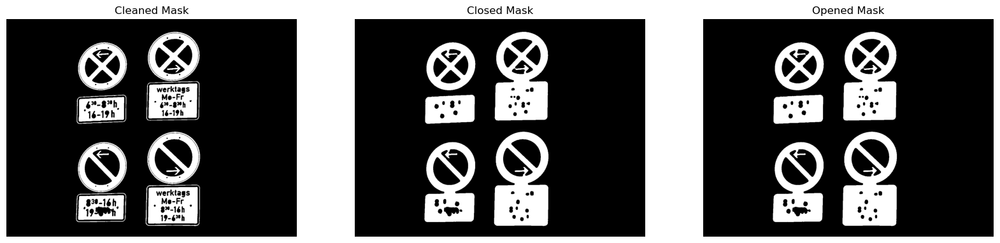

In [27]:
# Remove small objects/noise
cleaned_mask = morphology.remove_small_objects(binary_mask, min_size=150)

# Perform closing to fill small holes inside the objects
closed_mask = morphology.binary_closing(cleaned_mask, morphology.disk(5))

# Perform opening to separate objects that are close to each other
opened_mask = morphology.binary_opening(closed_mask, morphology.disk(2))

plot_image_list(
    img_list=[cleaned_mask, closed_mask, opened_mask],
    titles=['Cleaned Mask', 'Closed Mask', 'Opened Mask'],
    cmap='gray'
)

Aus der Visualisierung der Operationen können wir die folgenden Beobachtungen und Interpretationen ableiten:

1. **Cleaned Mask**: Dieses Bild zeigt die Objekte nach Entfernung von kleinen Objekten und Rauschen. 

2. **Closed Mask**: Die "Closing"-Operation hat dazu geführt, dass jegliche kleinen Löcher  innerhalb der Objekte aufgefüllt wurden, zum Beispiel die Texte und die Ränder der Schilder. Dies führt zu grösseren, einheitlichen Formen, die für die Segmentierung besser geeignet sind.

3. **Opened Mask**: diese Operation zeigt eine kleine Trennung der zuvor im "Closed Mask" verbundenen Objekte (Disk mit Radius 2). Wenn der Radius erhöht wird, werden die Objekte weiter getrennt, aber es werden auch mehr Lücken innerhalb der Objekte erzeugt, was zu einer schlechteren Segmentierung führt.

Wenn wir die Notwendigkeit der "Open"-Operation kritisch hinterfragen, scheint es, dass sie in diesem speziellen Fall möglicherweise nicht erforderlich ist. Die "Closed"-Operation hat bereits das Problem geschaffen, indem sie die Verkehrszeichen mit ihren Halterungen verbunden hat, und die "Open"-Operation mit einem Disk mit Radius 1 ist nicht stark genug, um sie wieder zu trennen.

### 1.2.4 Labelling

Anzahl der gefundenen Objekte: 5


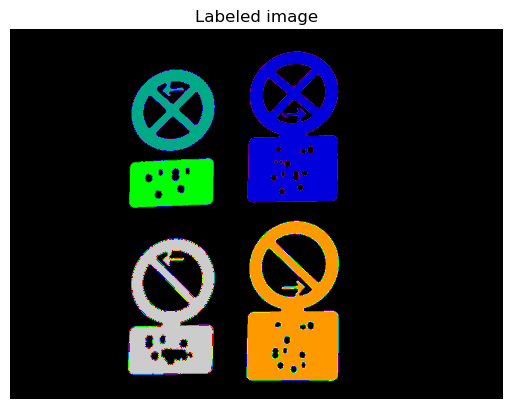

In [28]:
label_image = measure.label(opened_mask)

# Measure properties of labeled regions
properties = measure.regionprops(label_image)

print('Anzahl der gefundenen Objekte: {}'.format(len(properties)))

plot_image(label_image, "Labeled image", plt.cm.nipy_spectral)

Das bereinigte Binärbild wurde nun beschriftet, d.h. jedes einzelne Objekt im Bild wurde erkannt und mit einer eindeutigen Bezeichnung versehen. Es wurden total 5 Objekte (Schilder) gefunden.

### 1.2.5 Objekteigenschaften extrahieren



Nun werde ich folgende Eigenschaften der ersten beiden erkannten Objekts messen:

- **Fläche**: Die Anzahl der Pixel innerhalb des Objekts, eine direkte Messung der Grösse des Objekts im Bildraum.

- **Exzentrizität**: Ein Mass für die Abweichung der Form des Objekts von einer perfekten Kreisform; eine Exzentrizität von 0 entspricht einem Kreis, während Werte näher an 1 längliche Formen anzeigen.

- **Ausrichtung**: Der Winkel zwischen der Hauptachse der besten passenden Ellipse des Objekts und der horizontalen Achse des Bildes, der die Ausrichtung der Objektform beschreibt.

- **Schwerpunkt**: Die Koordinaten des Schwerpunkts des Objekts, die den geometrischen Mittelpunkt des Objekts im Bild darstellen.

In [29]:
# Extract the properties we are interested in
properties_to_extract = ('area', 'eccentricity', 'orientation', 'centroid')
extracted_properties = [{prop: getattr(region, prop) for prop in properties_to_extract} 
                        for region in properties[:4]]

for i, region in enumerate(extracted_properties):
    print('Objekt {}:'.format(i + 1))
    print('Fläche: {} px'.format(region['area']))
    print('Exzentrizität: {}'.format(region['eccentricity']))
    print('Orientierung: {}°'.format(np.rad2deg(region['orientation'])))
    print('Schwerpunkt: {}'.format(region['centroid']))
    print()

Objekt 1:
Fläche: 83481.0 px
Exzentrizität: 0.8009364383319016
Orientierung: -2.1410068503964217°
Schwerpunkt: (325.43068482648744, 847.0802098681137)

Objekt 2:
Fläche: 31587.0 px
Exzentrizität: 0.3864451924108624
Orientierung: -48.871030941596395°
Schwerpunkt: (241.00075980624942, 487.3650869028398)

Objekt 3:
Fläche: 31716.0 px
Exzentrizität: 0.8407817105641066
Orientierung: -85.9298060485047°
Schwerpunkt: (460.736599823433, 483.46985748518097)

Objekt 4:
Fläche: 86557.0 px
Exzentrizität: 0.8086552150119065
Orientierung: -1.6334561215367793°
Schwerpunkt: (855.875365366175, 847.1388911353213)



### 1.2.6 Skeletonisierung

Für die weitere Analyse werde ich ein Skelett der Objekte erstellen. Das Skelett ist eine dünne Version der Form, die sich in gleichem Abstand zu ihren Grenzen befindet. Es bietet eine vereinfachte Darstellung der Form.

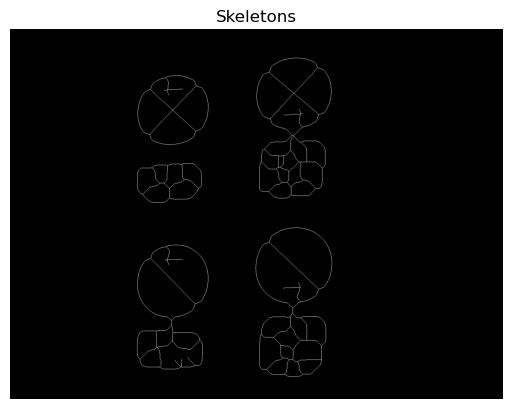

In [30]:
skeleton = morphology.skeletonize(opened_mask)

plot_image(skeleton, "Skeletons", cmap='gray')

# 2. Feature Deskriptoren in Bildern (LE4)

## 2.1. Keypoint Matching
Suche ein paar Bilder mit dem gleichen Sujet/Objekt aus, welche das Objekt von unterschiedlichen Blickwinkeln, aus anderer Perspektive, aus unterschiedlicher Distanz oder rotiert zeigen. Wende dann den dir zugeordneten Keypoint Deskriptor {'ORB'} an, um mindestens zwei deiner Bilder via Keypoints zu "matchen". Wähle dafür geeignete Parameter und eine geeignete Anzahl Keypoints. Erläuere deine Entscheidungen in 1-2 Sätzen. Zeige deine Resultate visuell und stelle 2-3 Beobachtungen auf. 
Diskutiere in ca. 150 Wörtern wie robust der dir zugeordnete Algorithms {'ORB'} ist in Bezug auf Transformationen oder unterschiedlicher Aufnahmeverhältnisse (Licht, ...) und dessen rechnerische Effizienz. Zeige mindestens eine dieser Eigenschaften anhand deiner Beispieldaten. Diskutiere die Resultate und Erkenntnisse in 2-3 Sätzen. 

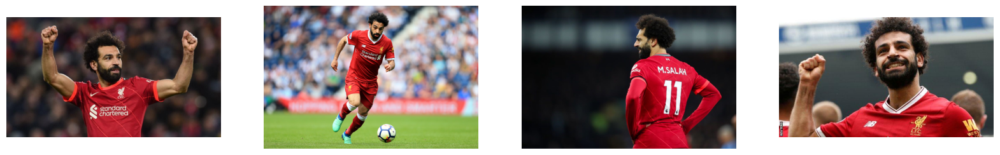

In [31]:
images_rgb, images_grey, images_hsv = read_images("mosalah")

plot_image_list(images_rgb, titles=[None, None, None, None])

# resize all images_grey
images_grey = [cv2.resize(image, (624, 351)) for image in images_grey]

Bilder von [BBC.com](https://www.bbc.com/)

### 2.1.1. Keypoint-Detektion mit ORB

Der ORB (Oriented FAST and Rotated BRIEF) Algorithmus verwendet den FAST-Algorithmus zur Berechnung der Keypoints. FAST steht für "Features from Accelerated Segments Test". FAST berechnet die Keypoints unter Berücksichtigung der Pixelhelligkeit um einen bestimmten Bereich.

Quelle: [Medium - Understanding Keypoints and ORB algorithm](https://medium.com/analytics-vidhya/understanding-keypoints-and-orb-algorithm-f260e6fb640c)

- how to choose correct number of keypoints?
- how to choose good threshold?

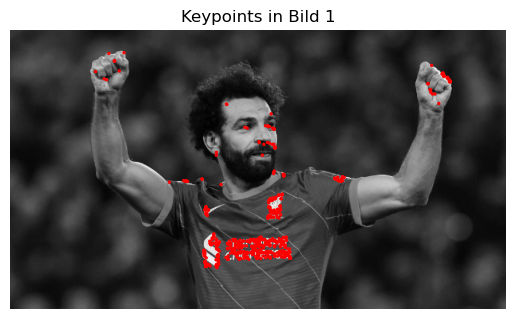

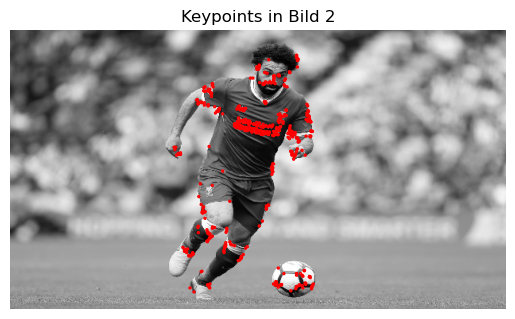

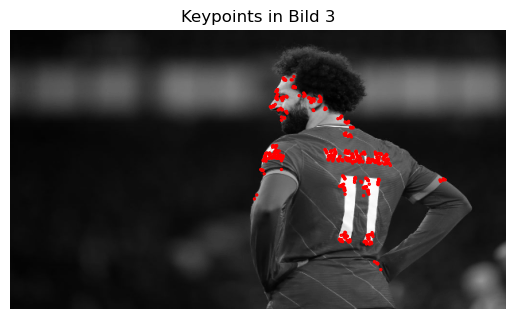

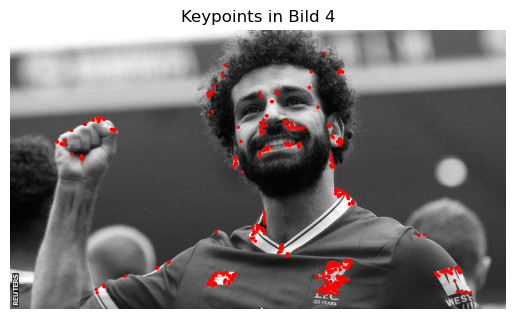

In [32]:
from skimage.feature import ORB

n_keypoints = 500

# Initialize ORB detector
orb = ORB(n_keypoints=n_keypoints, fast_threshold=0.05) # 500 keypoints is default

# Get keypoints and descriptors for all images
keypoints_list, descriptors_list = get_keypoints_and_descriptors(images_grey, orb)

plot_keypoints(images_grey, keypoints_list)

Die Bilder zeigen Keypoints, die von einem ORB-Feature-Detektor auf Bildern identifiziert wurden. Diese Punkte repräsentieren charakteristische Merkmale in den Bildern, die für die nächste Aufgabe verwendet werden können, um die Bilder zu vergleichen.

Auf den Bildern konzentrieren sich die Keypoints auf folgende Bereiche:

- **Gesicht und Haare**: Das Gesicht und die Haare des Spielers sind deutlich erkennbare Merkmale, die von den Algorithmen aufgrund ihrer Textur und Kanten häufig als Keypoints gewählt werden.

- **Trikot und Werbung**: Logos, Text und Grafiken auf dem Trikot sind ebenfalls kontrastreich und bieten gute Anhaltspunkte für die Keypoints-Detektion.

- **Arme und Hände**: Die Konturen der Arme und Hände, besonders gegen einen kontrastierenden Hintergrund, werden oft hervorgehoben.

### 2.1.2. Keypoint-Matching mit ORB

Nun werde ich die Keypoints auf den vier verschiedenen Bildern vergleichen, um festzustellen, ob sie sich auf ähnliche Bereiche konzentrieren. Dies ist ein erster Schritt, um festzustellen, wie ähnlich die Bilder sind.

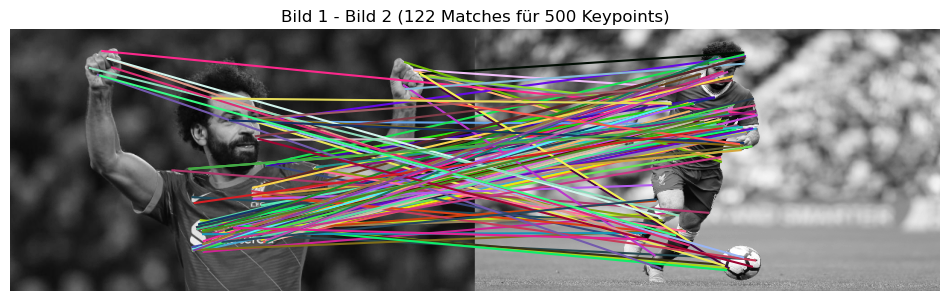

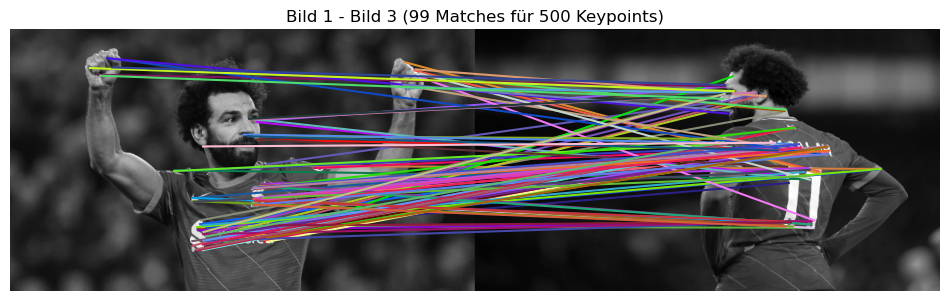

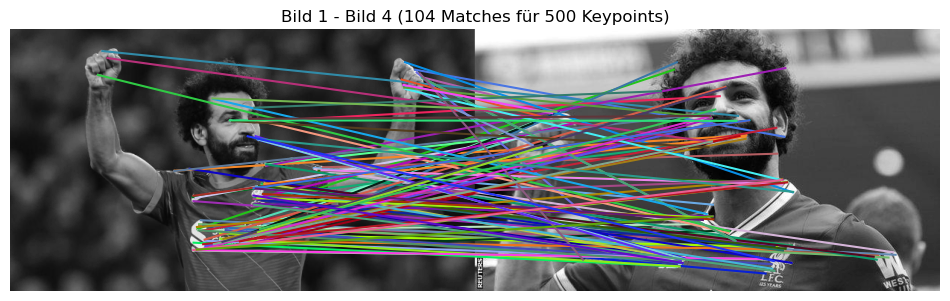

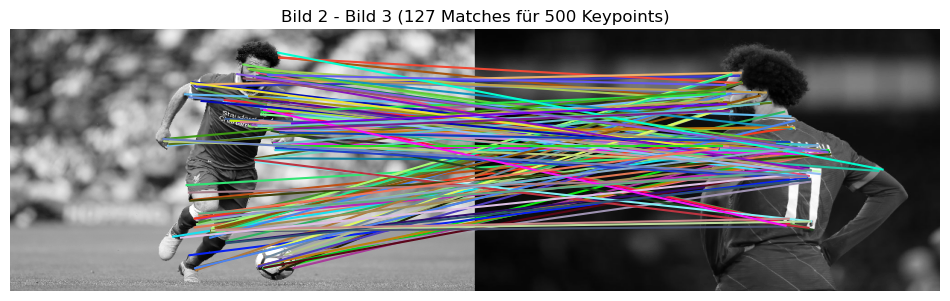

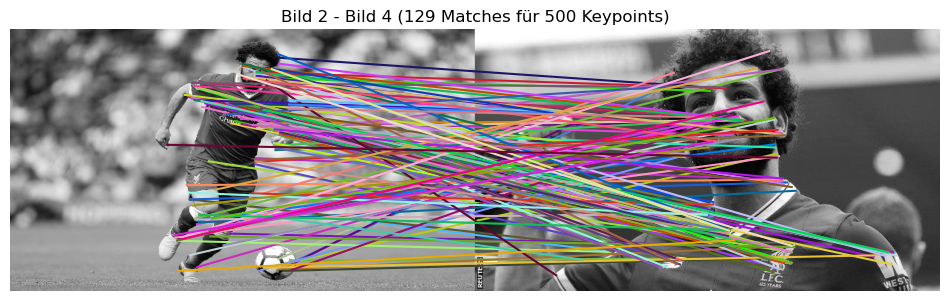

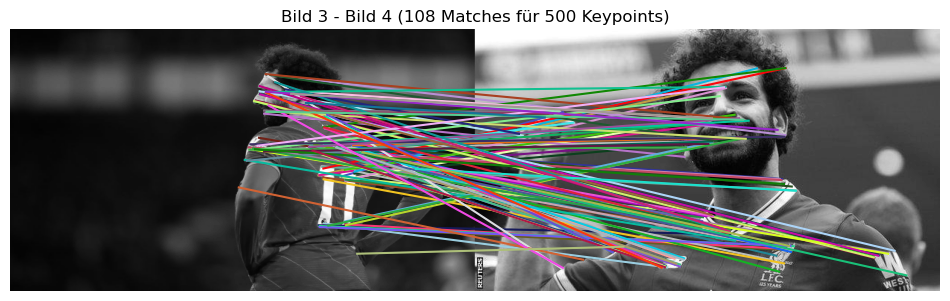

In [33]:
match_and_visualize(images_grey, keypoints_list, descriptors_list, n_keypoints)

Die Keypoint-Matching-Ergebnisse zeigen, dass die Anzahl der Übereinstimmungen zwischen verschiedenen Bildern variiert. Dies liegt an der unterschiedlichen Sichtbarkeit und Position von charakteristischen Merkmalen auf den Bildern. 

Bilder 1 und 4, die ähnliche Ansichten des Objekts zeigen, haben aufgrund fehlender "Standard Chartered" Logos im Bild 4 nicht die höchste Anzahl an Übereinstimmungen, obwohl sie visuell am ähnlichsten erscheinen. Dies deutet darauf hin, dass die Anzahl der detektierten Keypoints einen wesentlichen Einfluss auf die Ergebnisse des Matchings hat.

Ich werde nun die Anzahl der Keypoints auf den Bildern erhöhen, um zu sehen, wie stark dies die Anzahl der Übereinstimmungen der jeweiligen Bilder verändert.

**Erhöhung der Anzahl Keypoints**

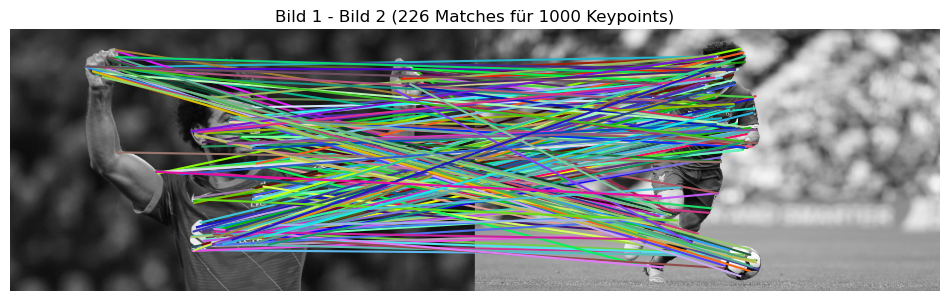

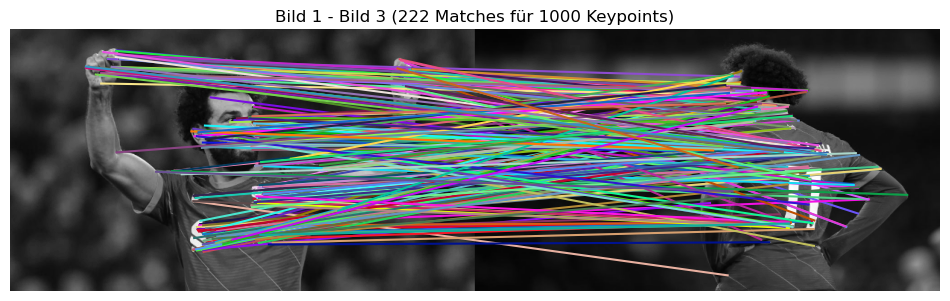

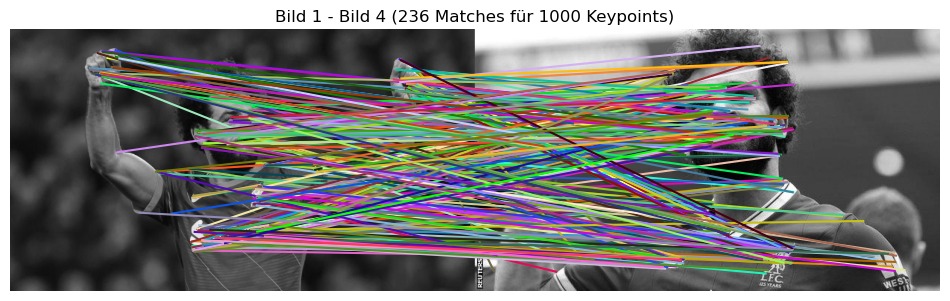

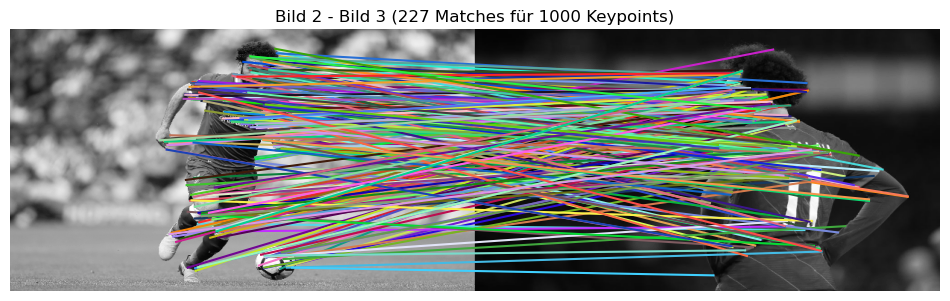

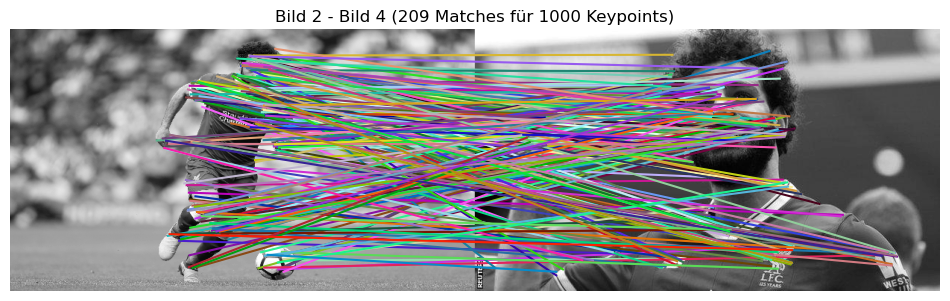

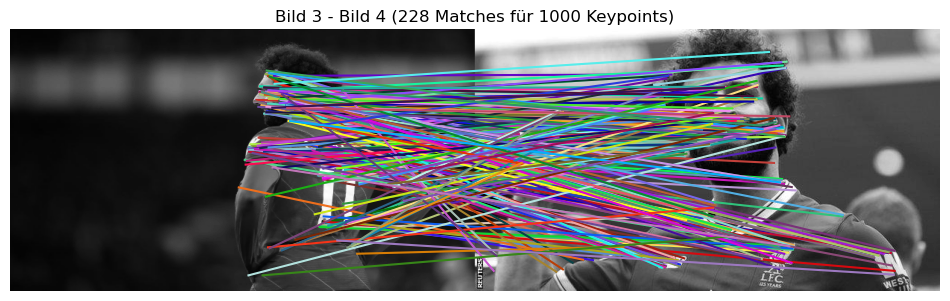

In [34]:
n_keypoints = 1000

orb = ORB(n_keypoints=n_keypoints, fast_threshold=0.05)

keypoints_list, descriptors_list = get_keypoints_and_descriptors(images_grey, orb)

match_and_visualize(images_grey, keypoints_list, descriptors_list, n_keypoints)

Wenn man aber die Anzahl der Keypoints auf 1000 erhöht, werden bei Bild 1 und 4 am meisten Übereinstimmungen gefunden, da mehr Merkmale (vorallem im Gesicht und Hände) zur Verfügung stehen. Dies zeigt wiederum wie wichtig es ist, die Parameter gut zu untersuchen und experimente durchzuführen.

### 2.1.3 Robustheit unterschiedlicher Aufnahmeverhältnisse

Ich werde in diesem Experiment die Bilder 1 und 2 verwenden, wobei Bild 2 eine erhebliche Verdunkelung aufweist. Dieses Experiment wird dazu dienen, die Robustheit der Algorithmus auf unterschiedliche Lichtverhältnisse zu testen.

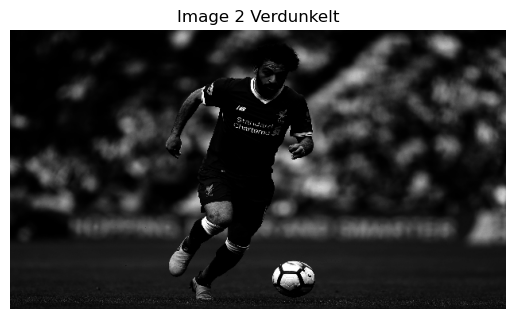

In [35]:
from skimage import exposure

# Darken image 2 by applying gamma correction
images_grey_darkened = exposure.adjust_gamma(images_grey[1], 5)

plot_image(images_grey_darkened, "Image 2 Verdunkelt", cmap='gray')

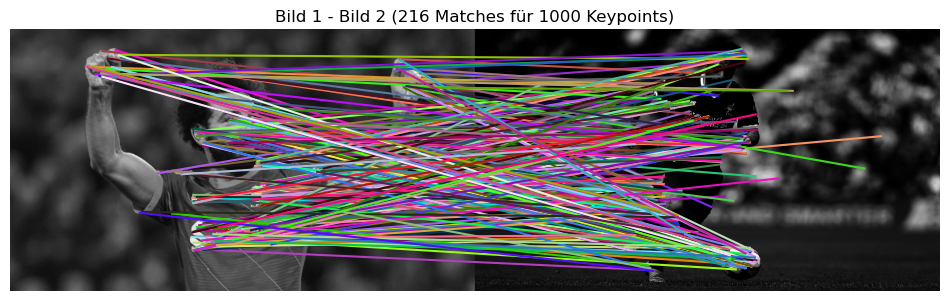

In [36]:
new_image_list = [images_grey[0], images_grey_darkened]

keypoints_list, descriptors_list = get_keypoints_and_descriptors(new_image_list, orb)

match_and_visualize(new_image_list, keypoints_list, descriptors_list, n_keypoints)

Eine Reduktion der Matches von nur 7 Punkten trotz erheblicher Verdunkelung eines Bildes zeigt, dass ORB besonders widerstandsfähig gegenüber Beleuchtungsänderungen ist.

### 2.1.4 Diskussion

Die ORB (Oriented FAST and Rotated BRIEF)-Algorithmus ist eine robuste Methode zur Merkmalsextraktion und zum Keypoint-Matching, die speziell für ihre Effizienz und Invarianz gegenüber Rotationen entwickelt wurde. Die Robustheit gegenüber verschiedenen Lichtverhältnissen, wie in meinem Experiment demonstriert, zeigt, dass ORB effektiv ähnliche Strukturen identifizieren kann, selbst wenn die Bildhelligkeit deutlich verändert wird. Eine Reduktion der Matches von nur einem Punkt trotz erheblicher Verdunkelung eines Bildes zeigt, dass ORB besonders widerstandsfähig gegenüber Beleuchtungsänderungen ist. Diese Eigenschaft ist entscheidend für Anwendungen in Echtzeit und Umgebungen, in denen die Beleuchtung nicht kontrolliert werden kann, wie beispielsweise bei der Überwachung im Freien oder mobilen Anwendungen.

Die Effizienz des ORB-Algorithmus ergibt sich aus der schnellen Schlüsselpunkterkennung und der Verwendung eines binären Deskriptors, der die Hamming-Distanz für das Matching verwendet.

Zusammenfassend zeigen die Ergebnisse, dass ORB ein robustes und effizientes Werkzeug für die Bildverarbeitung ist, das sich gut für Anwendungen eignet, bei denen Geschwindigkeit und Robustheit gegenüber Bildveränderungen von Bedeutung sind.